In [1]:
from google.colab import drive
drive.mount('/content/drive')
%cd /content/drive/MyDrive/ML/UNET

Mounted at /content/drive
/content/drive/MyDrive/ML/UNET


In [2]:
import cv2
from model_unet import *
import matplotlib.pyplot as plt
import numpy as np
import glob
import os
from sklearn.model_selection import train_test_split


In [3]:
path = "data/Dataset_BUSI_with_GT"

In [4]:
CLASSES = sorted(os.listdir(path))
CLASSES

['benign', 'malignant', 'normal']

In [5]:
# size in article
# IMG_IN = 572
# IMG_OUT = 388
# size custom
IMG_IN = 224
IMG_OUT = 224

IN_CHANNEL = 3

In [6]:
def prepareData(path):
    data_mask = [glob.glob(path+f"/{CLASSES[i]}"+"/*mask.png") for i in range(len(CLASSES))]
    data_mask = sorted([file for class_paths in data_mask for file in class_paths])
    data_img = []
    for path_ in data_mask:
        img_path = path_.replace('_mask', '')
        data_img.append(img_path)
    N = len(data_img)
    X = np.zeros(shape=(N, IMG_IN, IMG_IN, IN_CHANNEL), dtype=np.float32)
    Y = np.zeros(shape=(N, IMG_OUT, IMG_OUT, 1), dtype=np.float32) # dim_out = 1, it is a mask
    for i, path_img in enumerate(data_img):
        img = cv2.imread(path_img)
        img = cv2.resize(img, (IMG_IN,IMG_IN))
        X[i] = img/255.

        tmp = np.zeros(shape=(IMG_OUT, IMG_OUT, 3)) # raw mask has 3 channels
        mask_1 = cv2.imread(data_mask[i])
        mask_1 = cv2.resize(mask_1, (IMG_OUT,IMG_OUT))
        path_mask_2 = data_mask[i].replace(".png", "_1.png")
        if os.path.isfile(path_mask_2): # if there is another mask for this image
            mask_2 = cv2.imread(path_mask_2)
            mask_2 = cv2.resize(mask_2, (IMG_OUT,IMG_OUT))
            tmp = tmp + mask_1 + mask_2
        else:
            tmp = tmp + mask_1
        tmp = tmp/255.
        tmp = np.where(tmp >= 0.5, 1.0, 0.0)
        Y[i] = np.expand_dims(tmp[..., 0], axis=-1)
    return X, Y



In [8]:
X, Y = prepareData(path)

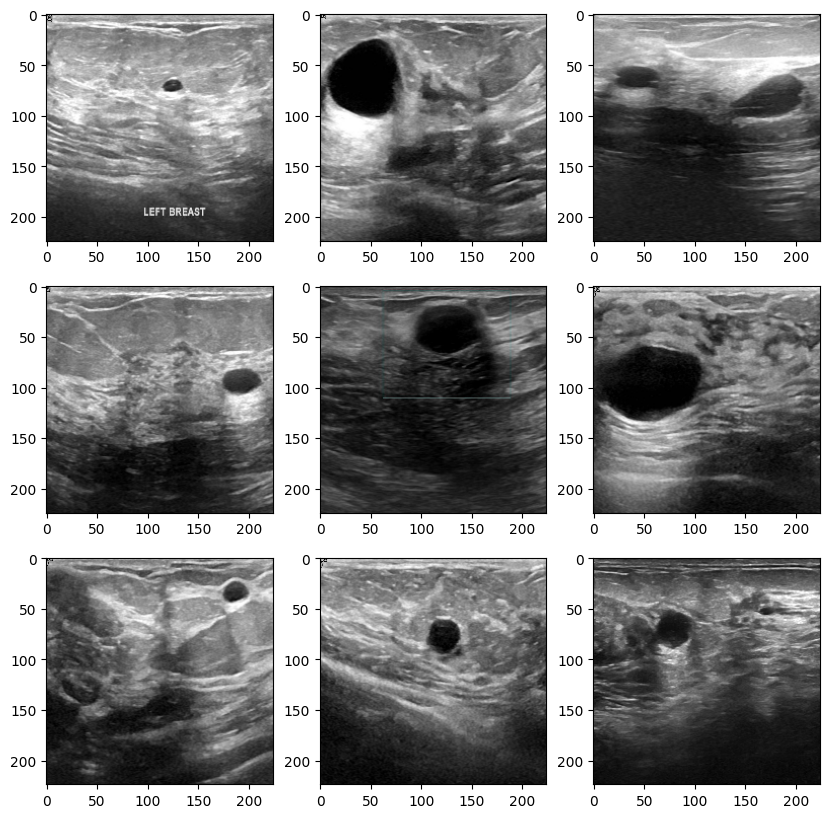

In [9]:
plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    plt.imshow(X[i])
    #plt.imshow(Y[i], alpha=0.6)

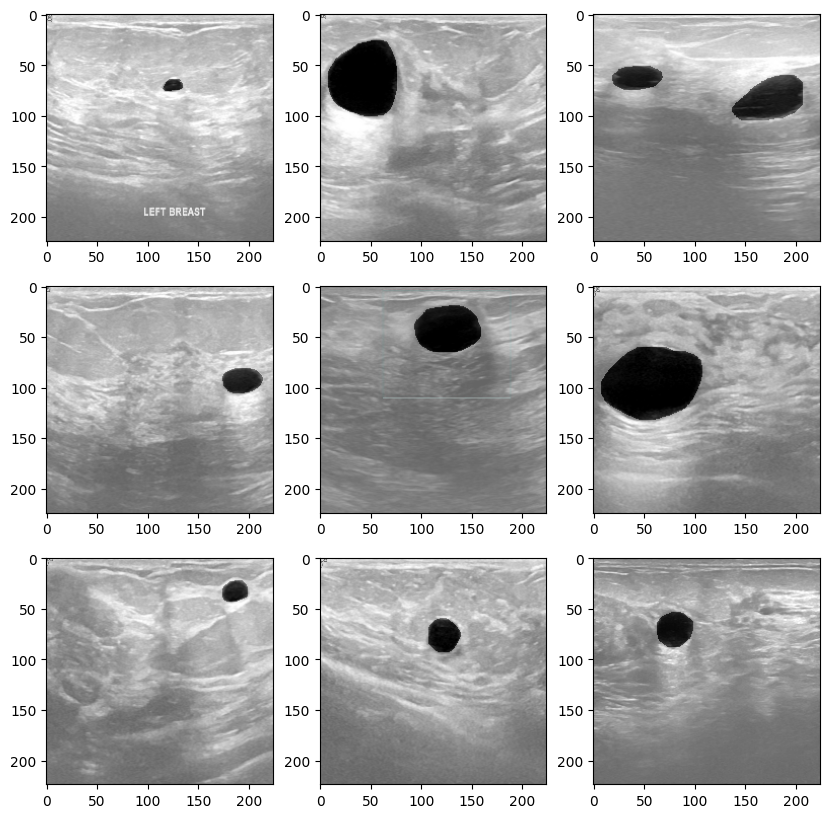

In [10]:
plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    plt.imshow(X[i])
    plt.imshow(cv2.resize(Y[i], (IMG_IN, IMG_IN)), cmap='binary', alpha=0.4)

In [11]:
X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size = 0.15, random_state=1)

In [12]:
n_train = len(X_train)
n_val = len(X_test)
class drawResult(tf.keras.callbacks.Callback):
    def on_epoch_end(self, epoch, logs=None):
        print(f"End epoch {epoch} of training")

        i_train = np.random.randint(n_train)
        i_test = np.random.randint(n_val)
        ypred = self.model(X_train[i_train:i_train+1]) # or expand dim 0
        ypred = tf.squeeze(ypred, axis=0)
        ypred = np.asarray(ypred).astype('float32')
        ypred = np.where(ypred >= 0.5, 1., 0.)

        ypred_test = self.model(X_test[i_test:i_test+1])
        ypred_test = tf.squeeze(ypred_test, axis=0)
        ypred_test = np.asarray(ypred_test).astype('float32')
        ypred_test = np.where(ypred_test >= 0.5, 1., 0.)

        # plot
        plt.figure(figsize=(10,5))
        # train
        plt.subplot(2, 3, 1)
        plt.title("IMG train")
        plt.imshow(X_train[i_train])
        plt.subplot(2, 3, 2)
        plt.title("True Mask")
        plt.imshow(X_train[i_train])
        plt.imshow(cv2.resize(Y_train[i_train], (IMG_IN, IMG_IN)), cmap='copper', alpha=0.4)
        plt.subplot(2, 3, 3)
        plt.title("Predicted Mask")
        plt.imshow(X_train[i_train])
        plt.imshow(cv2.resize(ypred, (IMG_IN, IMG_IN)), cmap='copper', alpha=0.4)
        # val
        plt.subplot(2, 3, 4)
        plt.title("IMG validation")
        plt.imshow(X_test[i_test])
        plt.subplot(2, 3, 5)
        plt.title("True Mask")
        plt.imshow(X_test[i_test])
        plt.imshow(cv2.resize(Y_test[i_test], (IMG_IN, IMG_IN)), cmap='copper', alpha=0.4)
        plt.subplot(2, 3, 6)
        plt.title("Predicted Mask")
        plt.imshow(X_test[i_test])
        plt.imshow(cv2.resize(ypred_test, (IMG_IN, IMG_IN)), cmap='copper', alpha=0.4)
        plt.tight_layout()
        plt.show()



Epoch 1/50


/usr/local/lib/python3.10/dist-packages/keras/src/backend.py:5805: UserWarning: "`binary_crossentropy` received `from_logits=True`, but the `output` argument was produced by a Sigmoid activation and thus does not represent logits. Was this intended?
  output, from_logits = _get_logits(


 6/42 [===>..........................] - ETA: 2s - loss: 3.4677

42/42 [==============================] - ETA: 0s - loss: 0.7761End epoch 0 of training


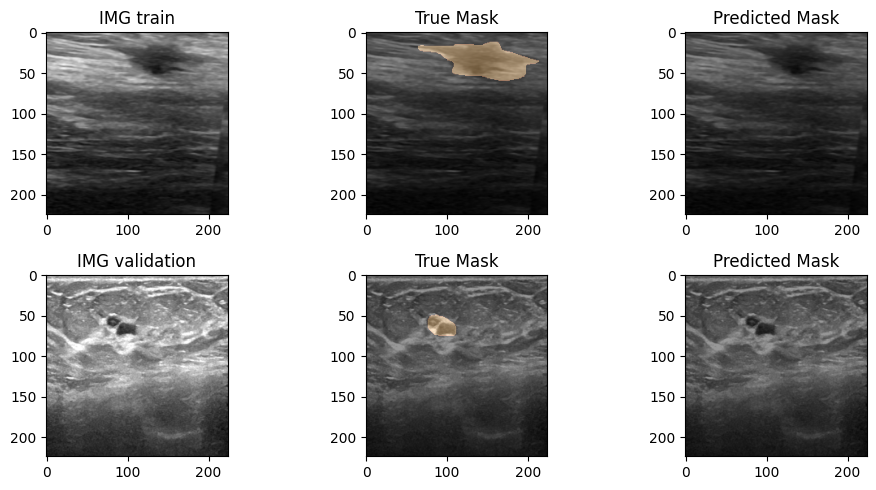

42/42 [==============================] - 32s 216ms/step - loss: 0.7761 - val_loss: 0.3057
Epoch 2/50
41/42 [============================>.] - ETA: 0s - loss: 0.2801End epoch 1 of training


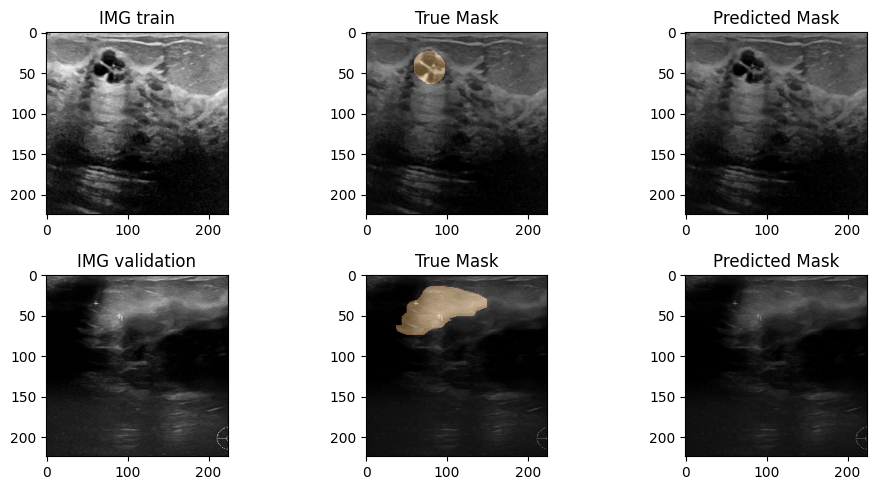

42/42 [==============================] - 4s 100ms/step - loss: 0.2783 - val_loss: 0.4551
Epoch 3/50
41/42 [============================>.] - ETA: 0s - loss: 0.3148End epoch 2 of training


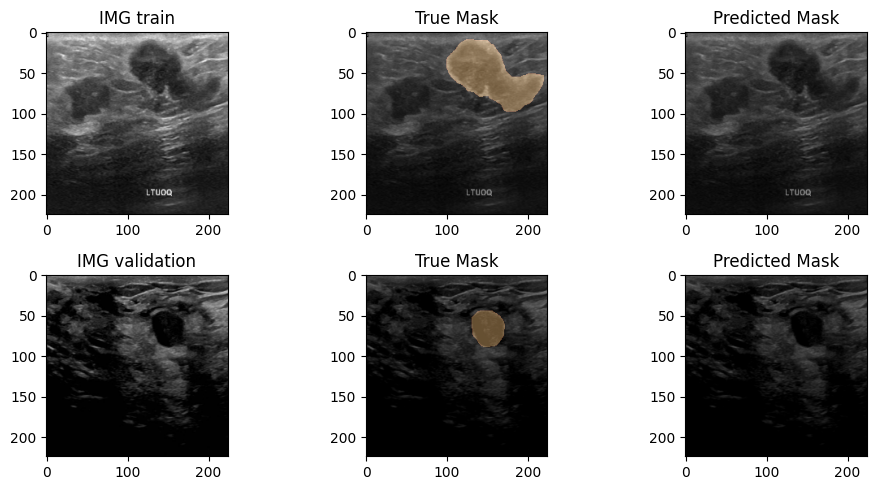

42/42 [==============================] - 4s 100ms/step - loss: 0.3131 - val_loss: 0.2863
Epoch 4/50
41/42 [============================>.] - ETA: 0s - loss: 0.2744End epoch 3 of training


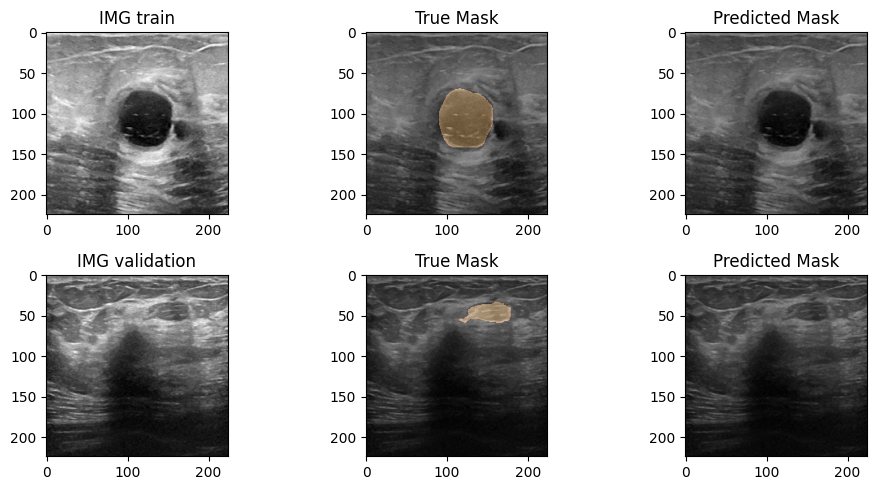

42/42 [==============================] - 4s 105ms/step - loss: 0.2754 - val_loss: 0.2681
Epoch 5/50
41/42 [============================>.] - ETA: 0s - loss: 0.2357End epoch 4 of training


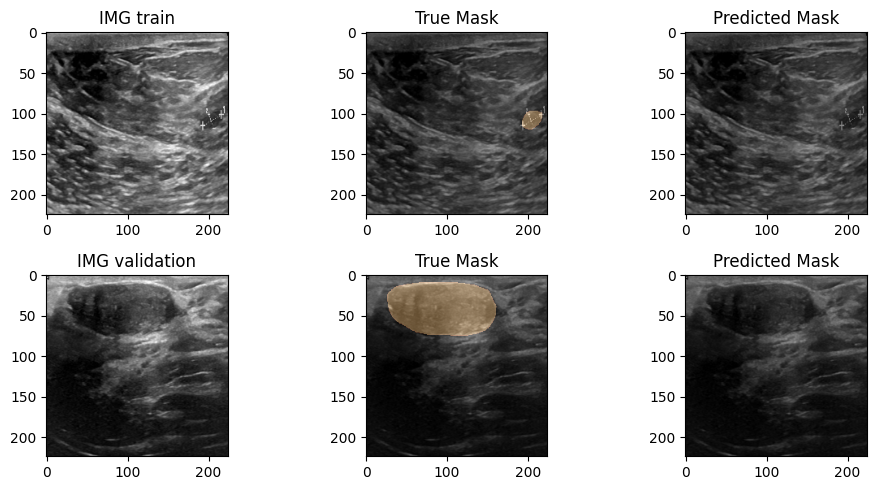

42/42 [==============================] - 4s 100ms/step - loss: 0.2341 - val_loss: 0.2104
Epoch 6/50
41/42 [============================>.] - ETA: 0s - loss: 0.2119End epoch 5 of training


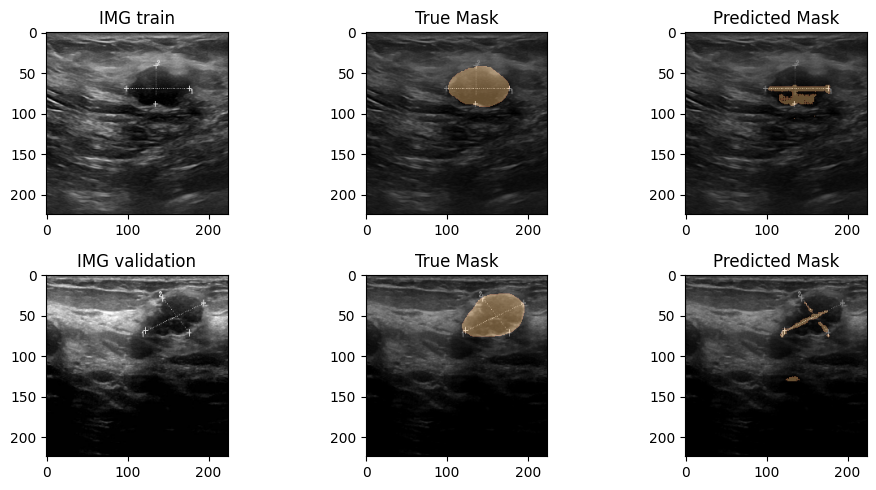

42/42 [==============================] - 4s 100ms/step - loss: 0.2116 - val_loss: 0.2102
Epoch 7/50
41/42 [============================>.] - ETA: 0s - loss: 0.2007End epoch 6 of training


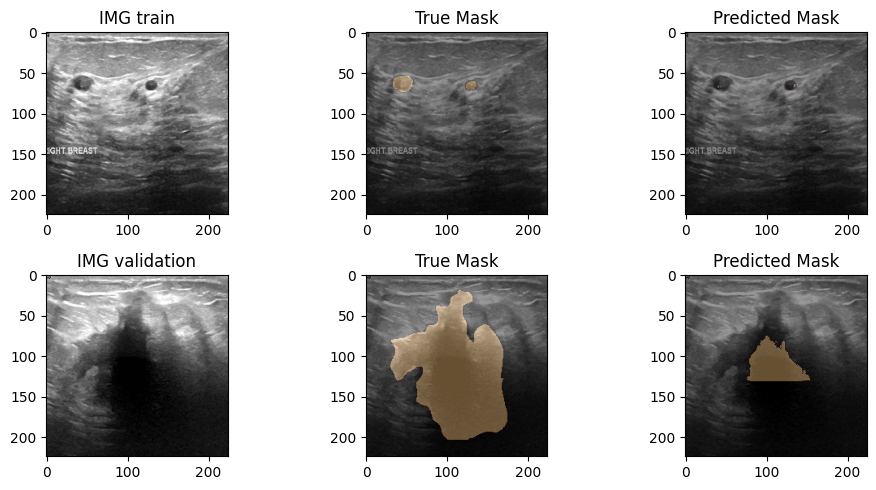

42/42 [==============================] - 4s 100ms/step - loss: 0.2013 - val_loss: 0.2055
Epoch 8/50
41/42 [============================>.] - ETA: 0s - loss: 0.1997End epoch 7 of training


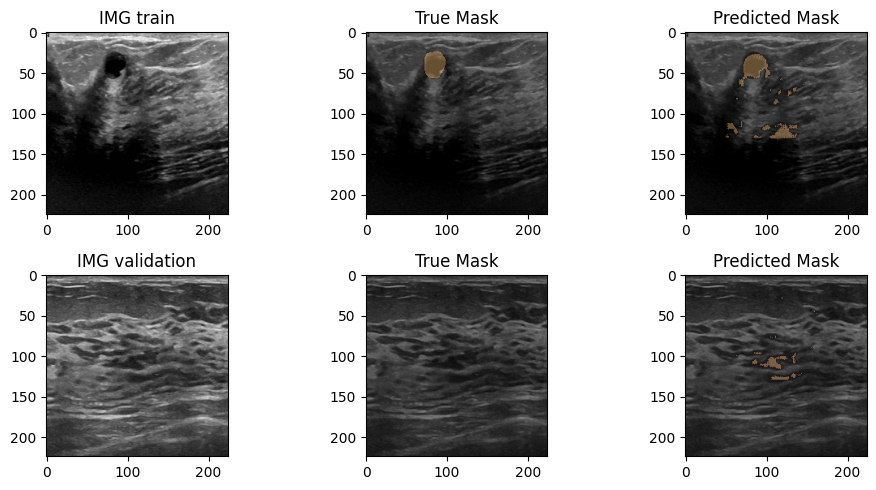

42/42 [==============================] - 4s 100ms/step - loss: 0.1997 - val_loss: 0.1960
Epoch 9/50
41/42 [============================>.] - ETA: 0s - loss: 0.1987End epoch 8 of training


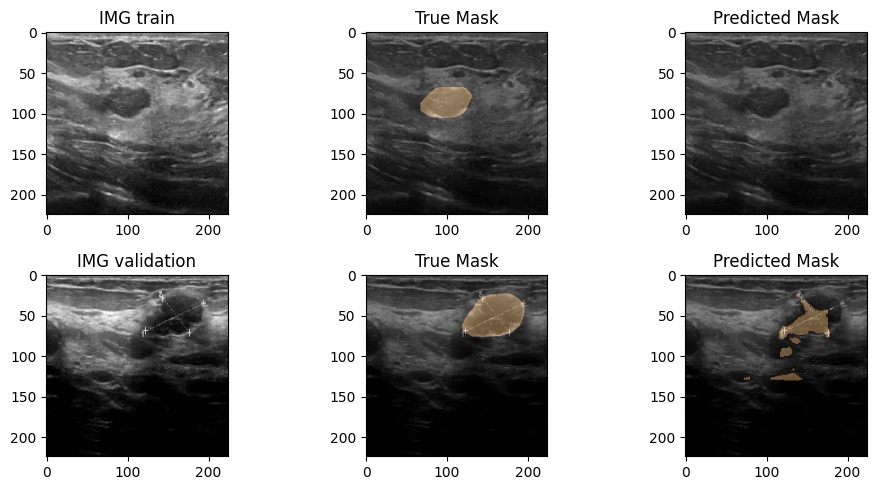

42/42 [==============================] - 4s 100ms/step - loss: 0.1984 - val_loss: 0.1948
Epoch 10/50
41/42 [============================>.] - ETA: 0s - loss: 0.1919End epoch 9 of training


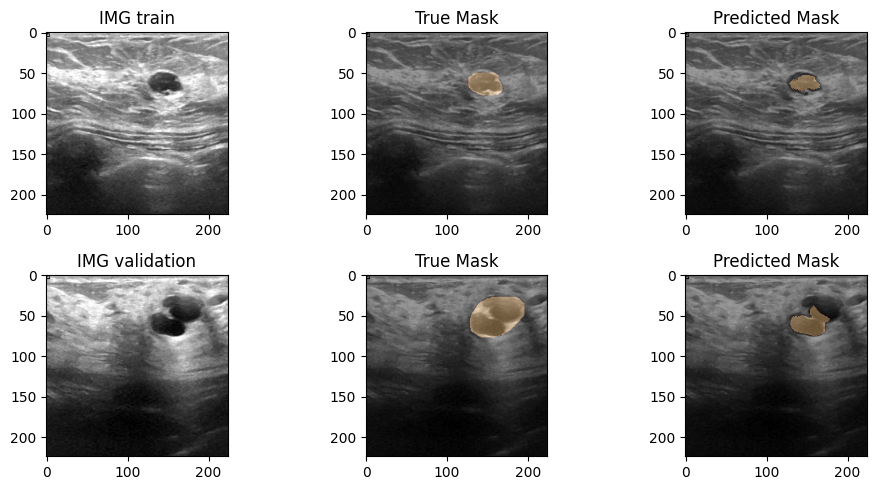

42/42 [==============================] - 4s 100ms/step - loss: 0.1904 - val_loss: 0.2095
Epoch 11/50
41/42 [============================>.] - ETA: 0s - loss: 0.1968End epoch 10 of training


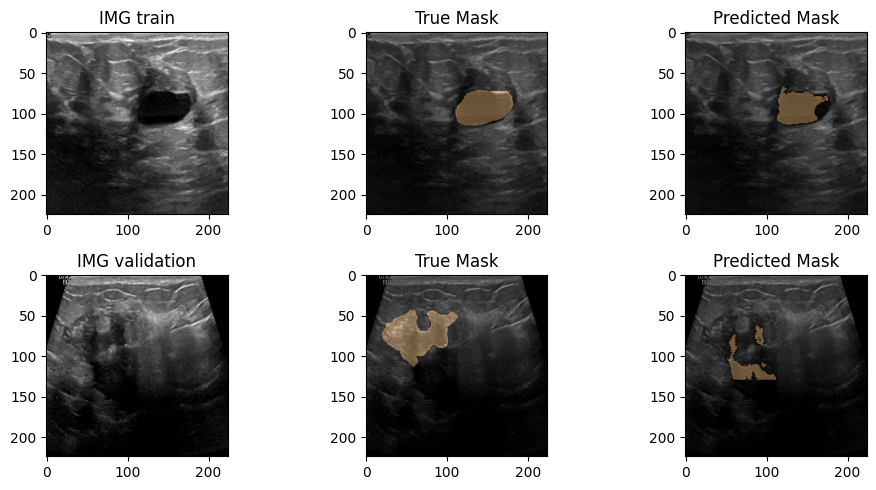

42/42 [==============================] - 4s 100ms/step - loss: 0.1963 - val_loss: 0.1935
Epoch 12/50
41/42 [============================>.] - ETA: 0s - loss: 0.1911End epoch 11 of training


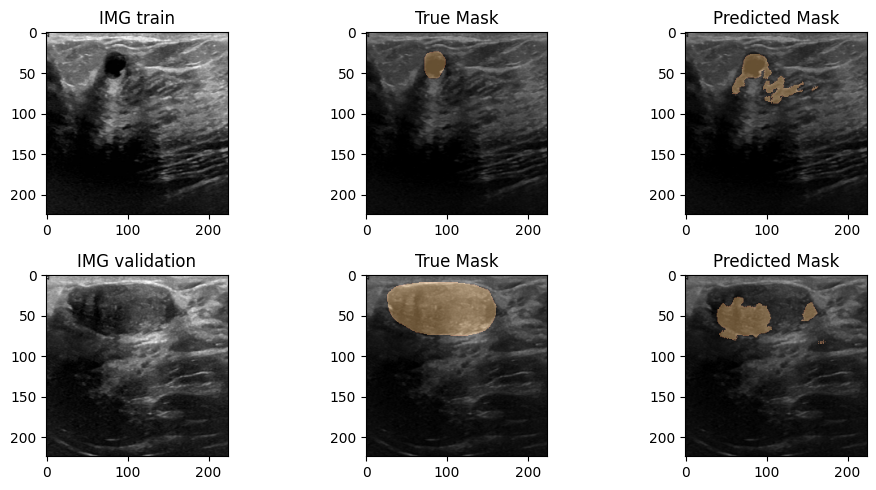

42/42 [==============================] - 4s 107ms/step - loss: 0.1907 - val_loss: 0.1872
Epoch 13/50
41/42 [============================>.] - ETA: 0s - loss: 0.1806End epoch 12 of training


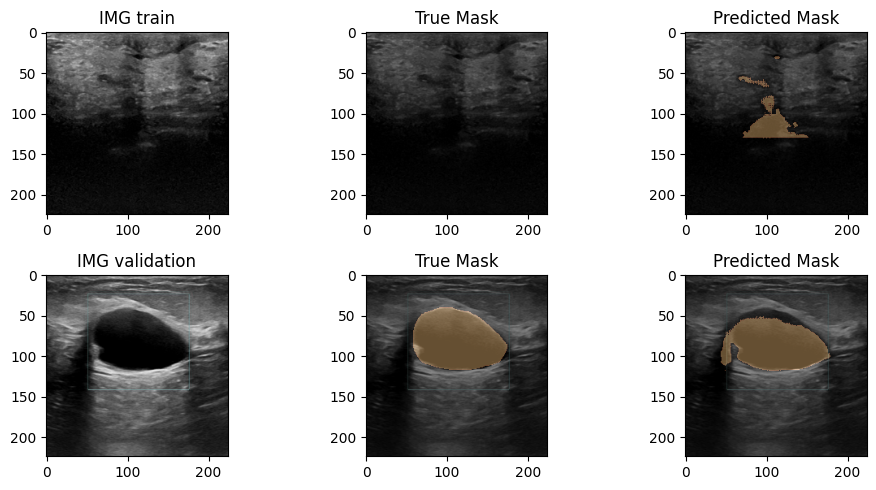

42/42 [==============================] - 4s 100ms/step - loss: 0.1802 - val_loss: 0.1719
Epoch 14/50
41/42 [============================>.] - ETA: 0s - loss: 0.1788End epoch 13 of training


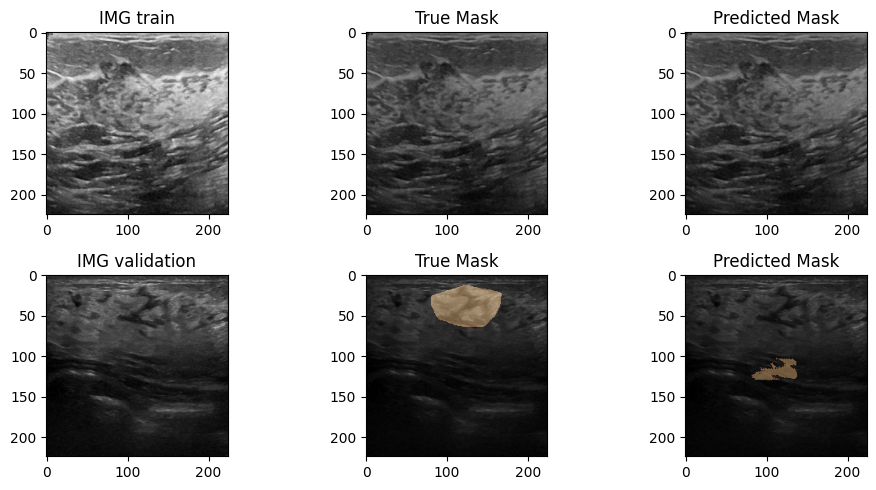

42/42 [==============================] - 4s 100ms/step - loss: 0.1783 - val_loss: 0.1748
Epoch 15/50
41/42 [============================>.] - ETA: 0s - loss: 0.1712End epoch 14 of training


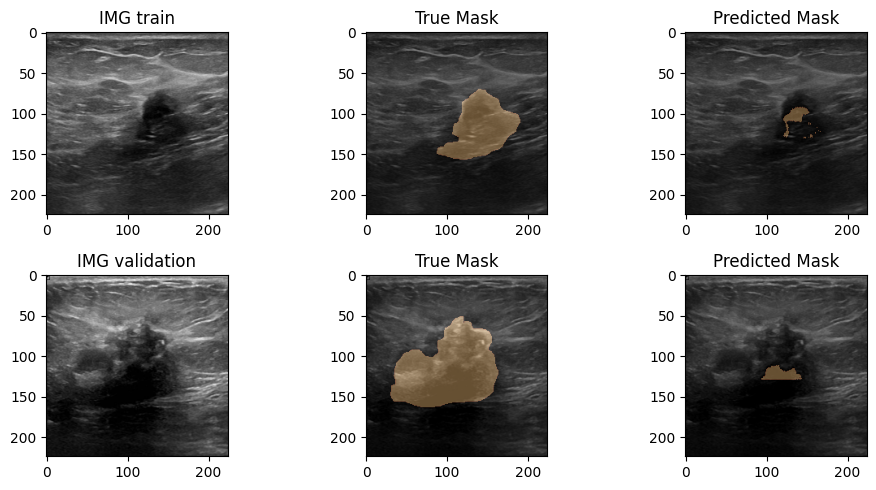

42/42 [==============================] - 4s 100ms/step - loss: 0.1720 - val_loss: 0.1903
Epoch 16/50
41/42 [============================>.] - ETA: 0s - loss: 0.1679End epoch 15 of training


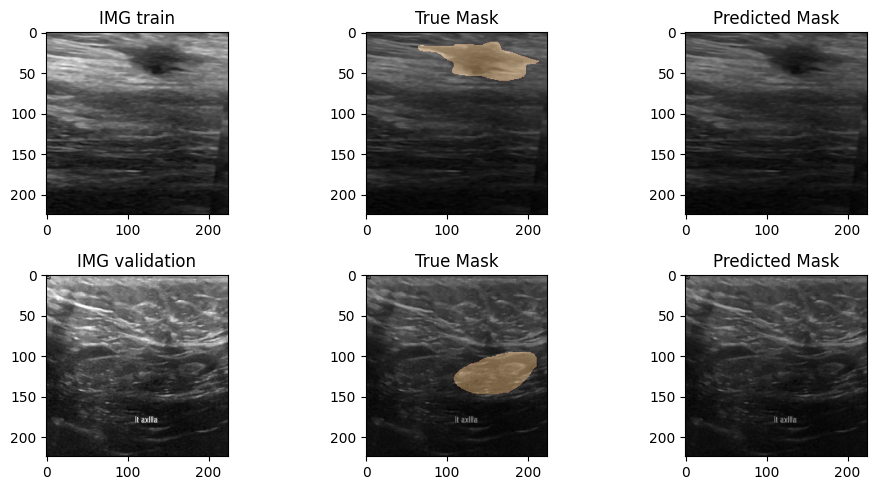

42/42 [==============================] - 4s 101ms/step - loss: 0.1675 - val_loss: 0.1678
Epoch 17/50
41/42 [============================>.] - ETA: 0s - loss: 0.1626End epoch 16 of training


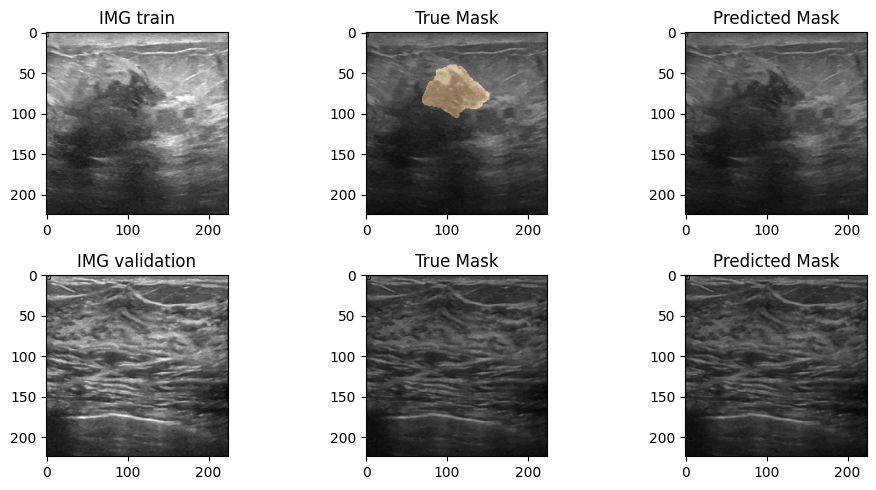

42/42 [==============================] - 4s 100ms/step - loss: 0.1632 - val_loss: 0.1666
Epoch 18/50
41/42 [============================>.] - ETA: 0s - loss: 0.1601End epoch 17 of training


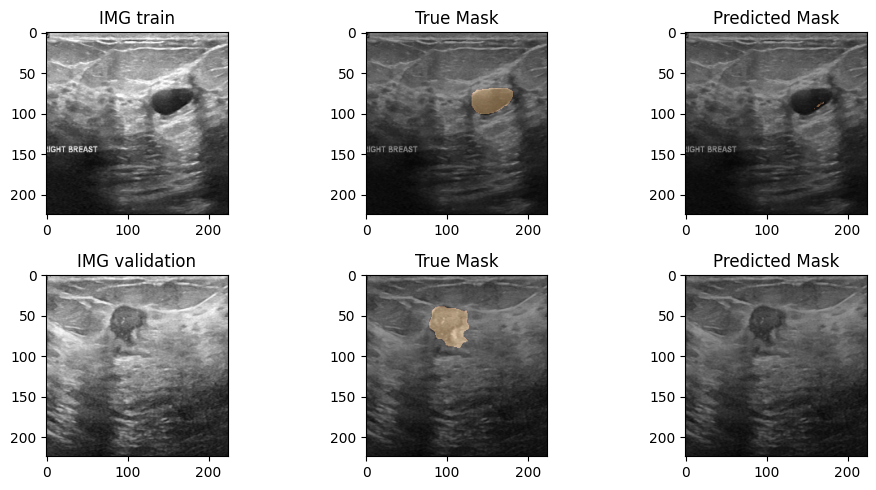

42/42 [==============================] - 4s 101ms/step - loss: 0.1595 - val_loss: 0.1672
Epoch 19/50
41/42 [============================>.] - ETA: 0s - loss: 0.1573End epoch 18 of training


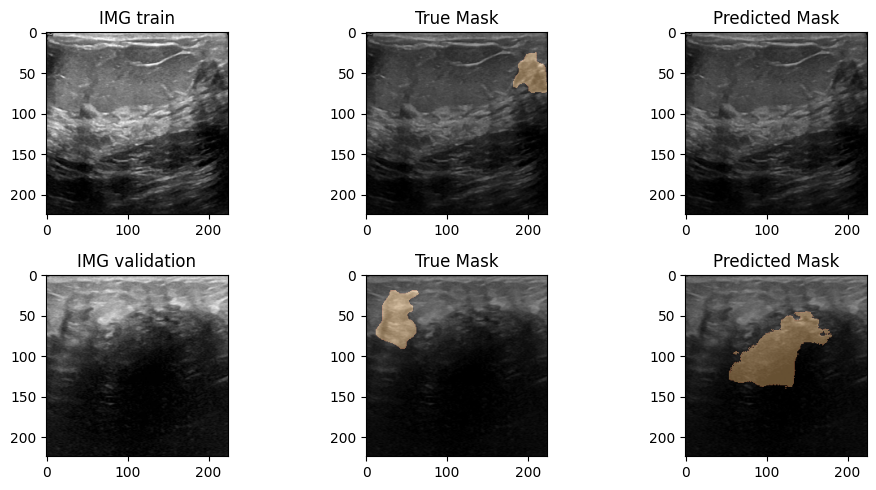

42/42 [==============================] - 4s 101ms/step - loss: 0.1576 - val_loss: 0.1574
Epoch 20/50
41/42 [============================>.] - ETA: 0s - loss: 0.1514End epoch 19 of training


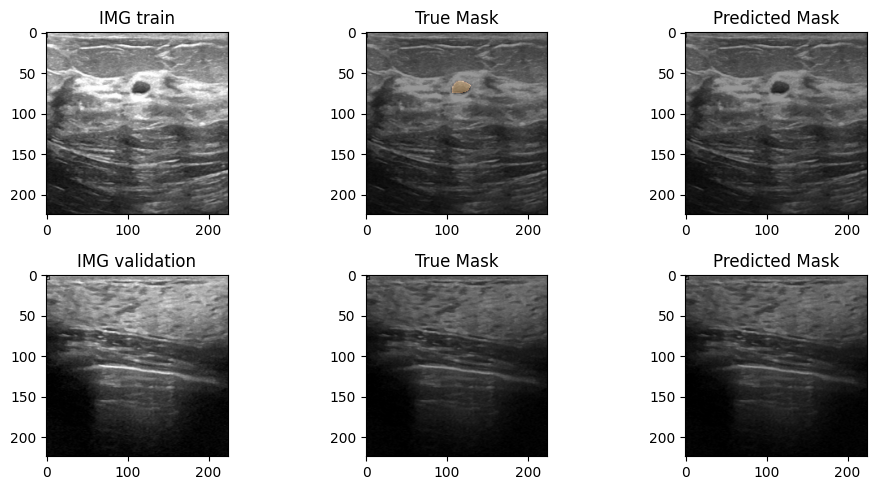

42/42 [==============================] - 4s 107ms/step - loss: 0.1511 - val_loss: 0.1578
Epoch 21/50
41/42 [============================>.] - ETA: 0s - loss: 0.1485End epoch 20 of training


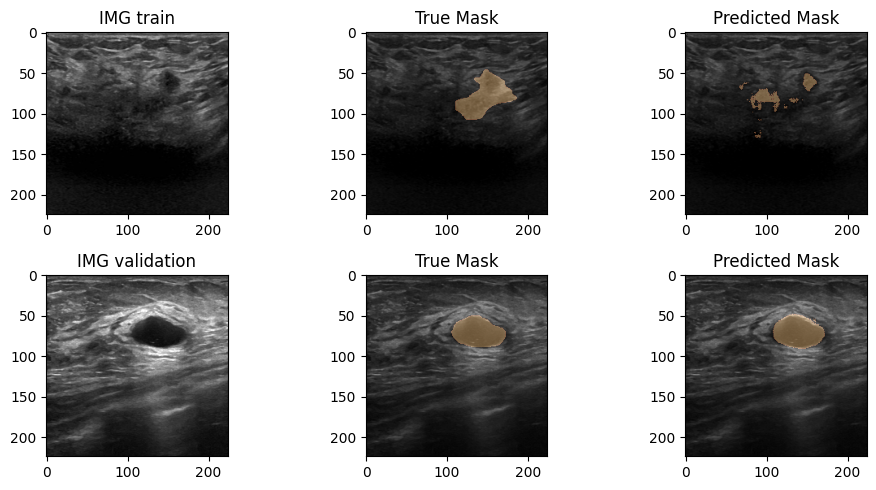

42/42 [==============================] - 4s 101ms/step - loss: 0.1492 - val_loss: 0.1675
Epoch 22/50
41/42 [============================>.] - ETA: 0s - loss: 0.1532End epoch 21 of training


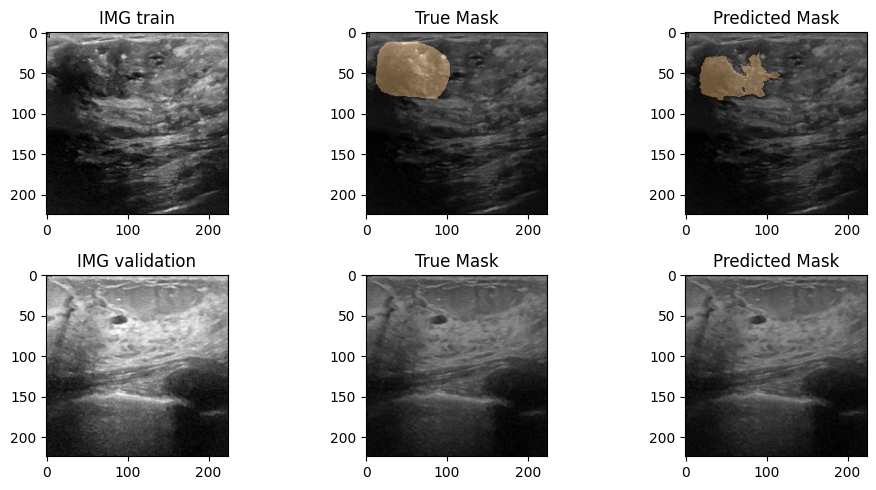

42/42 [==============================] - 4s 100ms/step - loss: 0.1544 - val_loss: 0.1508
Epoch 23/50
41/42 [============================>.] - ETA: 0s - loss: 0.1449End epoch 22 of training


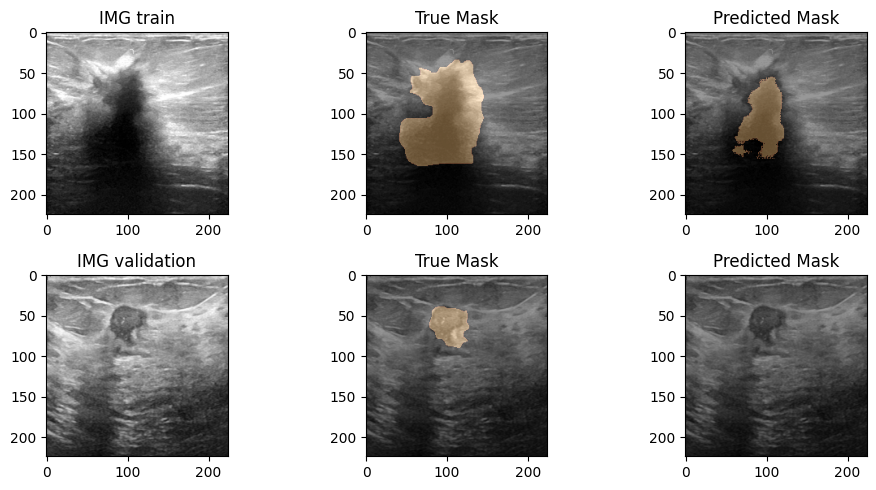

42/42 [==============================] - 4s 103ms/step - loss: 0.1446 - val_loss: 0.1644
Epoch 24/50
41/42 [============================>.] - ETA: 0s - loss: 0.1384End epoch 23 of training


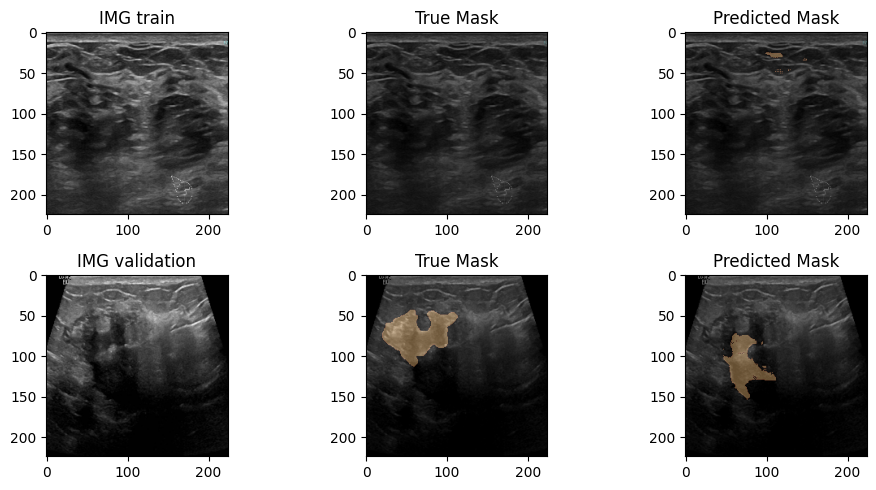

42/42 [==============================] - 4s 102ms/step - loss: 0.1387 - val_loss: 0.1381
Epoch 25/50
41/42 [============================>.] - ETA: 0s - loss: 0.1340End epoch 24 of training


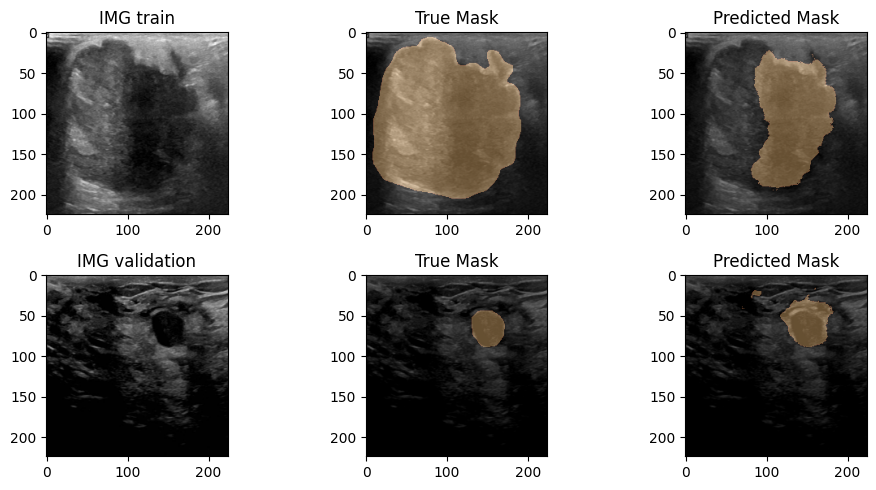

42/42 [==============================] - 4s 101ms/step - loss: 0.1345 - val_loss: 0.1393
Epoch 26/50
41/42 [============================>.] - ETA: 0s - loss: 0.1275End epoch 25 of training


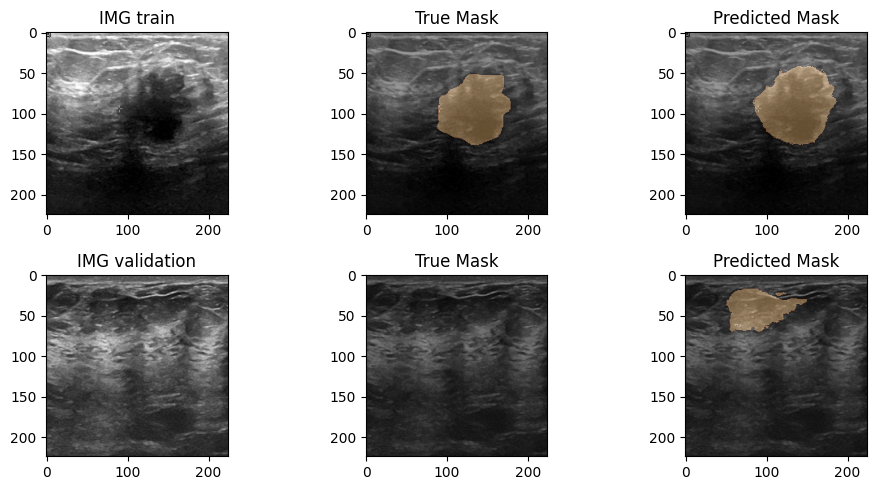

42/42 [==============================] - 4s 101ms/step - loss: 0.1274 - val_loss: 0.1392
Epoch 27/50
41/42 [============================>.] - ETA: 0s - loss: 0.1242End epoch 26 of training


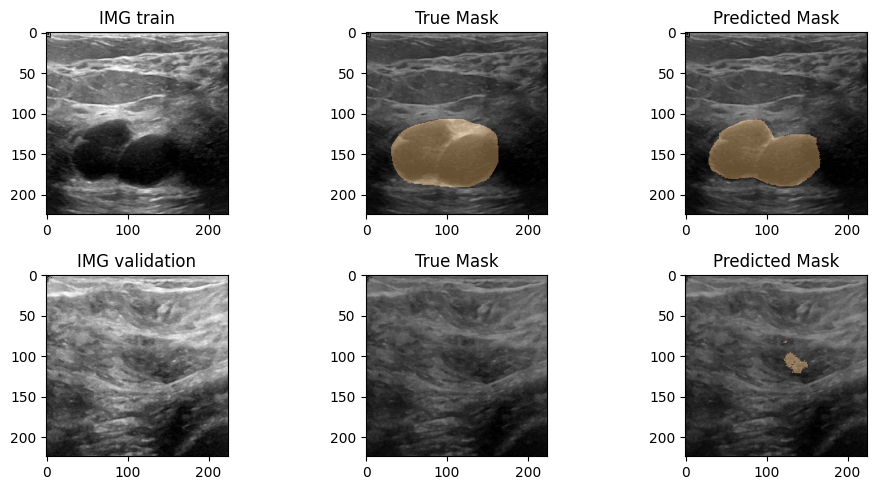

42/42 [==============================] - 4s 100ms/step - loss: 0.1241 - val_loss: 0.1624
Epoch 28/50
41/42 [============================>.] - ETA: 0s - loss: 0.1173End epoch 27 of training


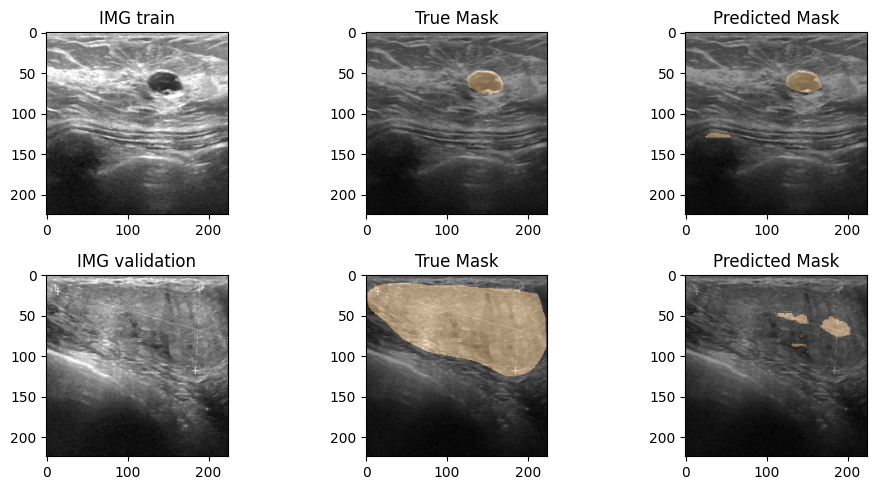

42/42 [==============================] - 5s 110ms/step - loss: 0.1172 - val_loss: 0.1244
Epoch 29/50
41/42 [============================>.] - ETA: 0s - loss: 0.1185End epoch 28 of training


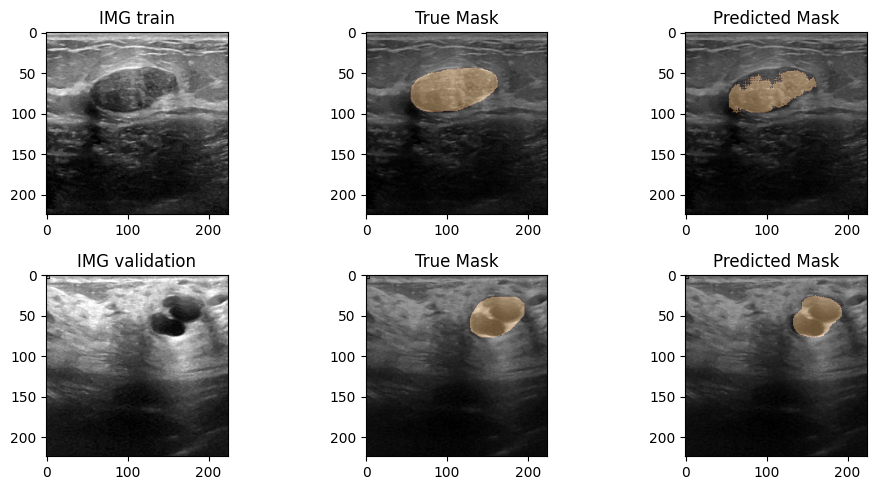

42/42 [==============================] - 4s 101ms/step - loss: 0.1186 - val_loss: 0.1266
Epoch 30/50
41/42 [============================>.] - ETA: 0s - loss: 0.1060End epoch 29 of training


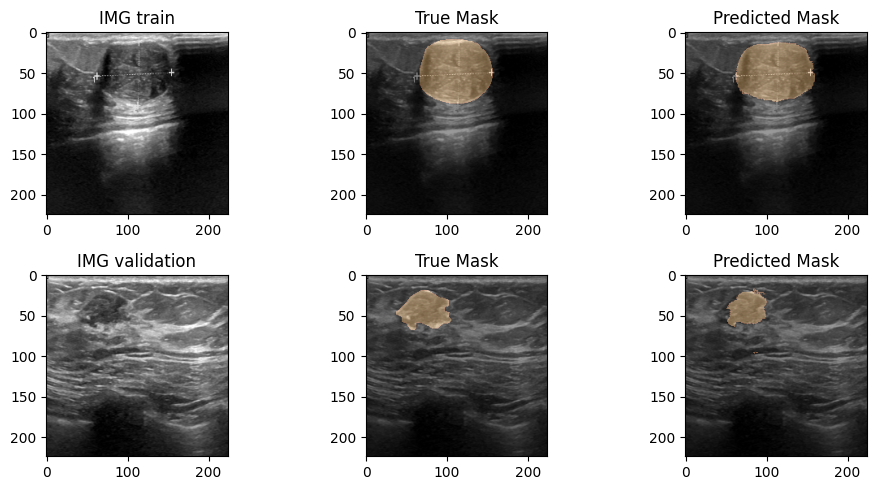

42/42 [==============================] - 4s 102ms/step - loss: 0.1064 - val_loss: 0.1306
Epoch 31/50
41/42 [============================>.] - ETA: 0s - loss: 0.1022End epoch 30 of training


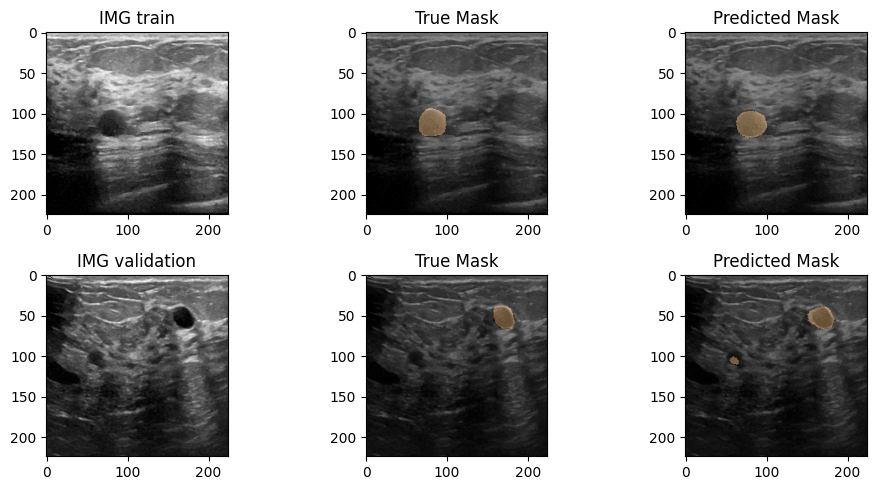

42/42 [==============================] - 4s 102ms/step - loss: 0.1018 - val_loss: 0.1299
Epoch 32/50
41/42 [============================>.] - ETA: 0s - loss: 0.0952End epoch 31 of training


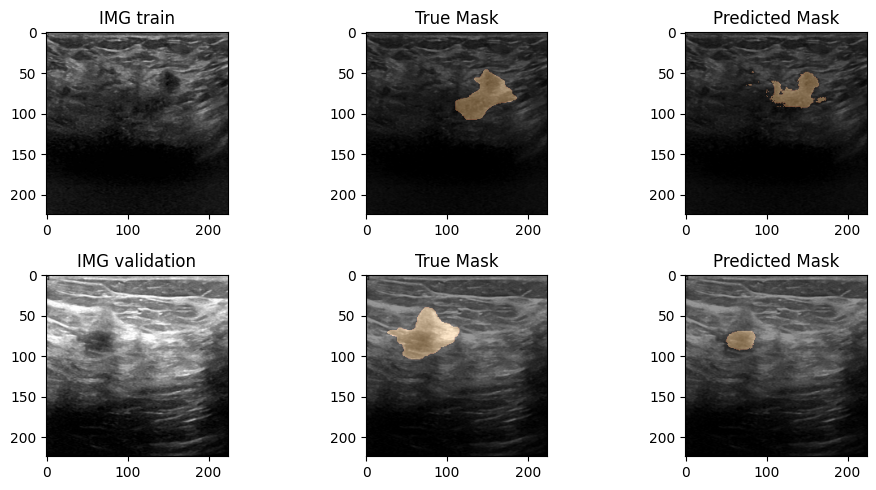

42/42 [==============================] - 4s 100ms/step - loss: 0.0956 - val_loss: 0.1284
Epoch 33/50
41/42 [============================>.] - ETA: 0s - loss: 0.0865End epoch 32 of training


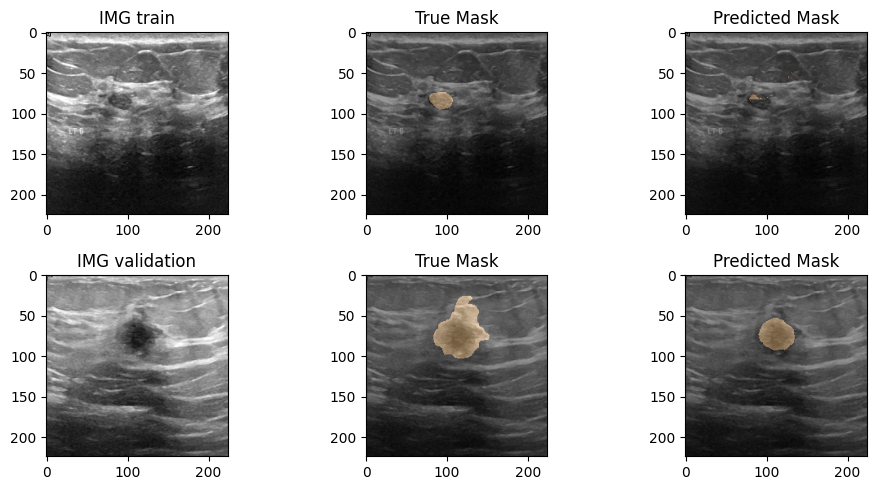

42/42 [==============================] - 4s 102ms/step - loss: 0.0865 - val_loss: 0.1354
Epoch 34/50
41/42 [============================>.] - ETA: 0s - loss: 0.0852End epoch 33 of training


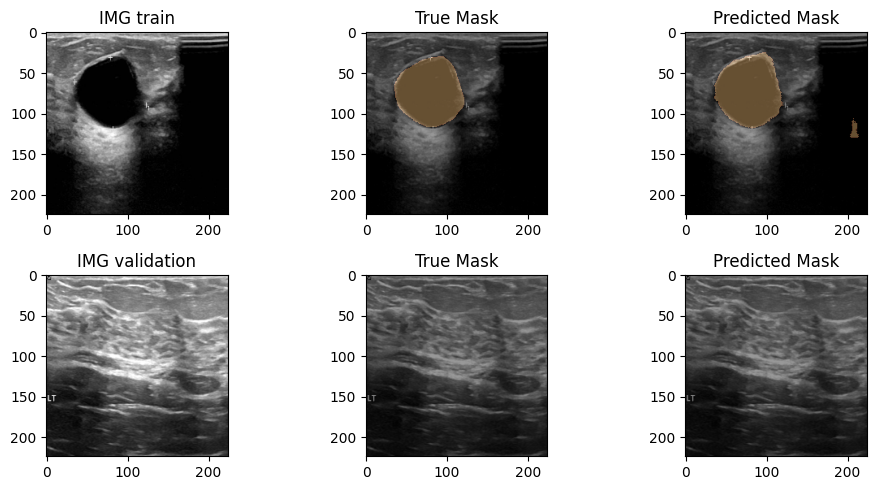

42/42 [==============================] - 4s 102ms/step - loss: 0.0854 - val_loss: 0.1363
Epoch 35/50
41/42 [============================>.] - ETA: 0s - loss: 0.0844End epoch 34 of training


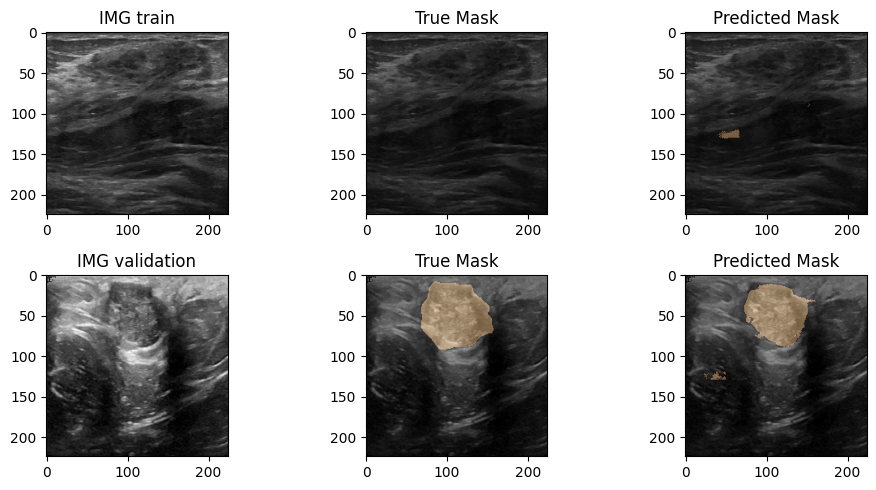

42/42 [==============================] - 4s 100ms/step - loss: 0.0849 - val_loss: 0.1270
Epoch 36/50
41/42 [============================>.] - ETA: 0s - loss: 0.0792End epoch 35 of training


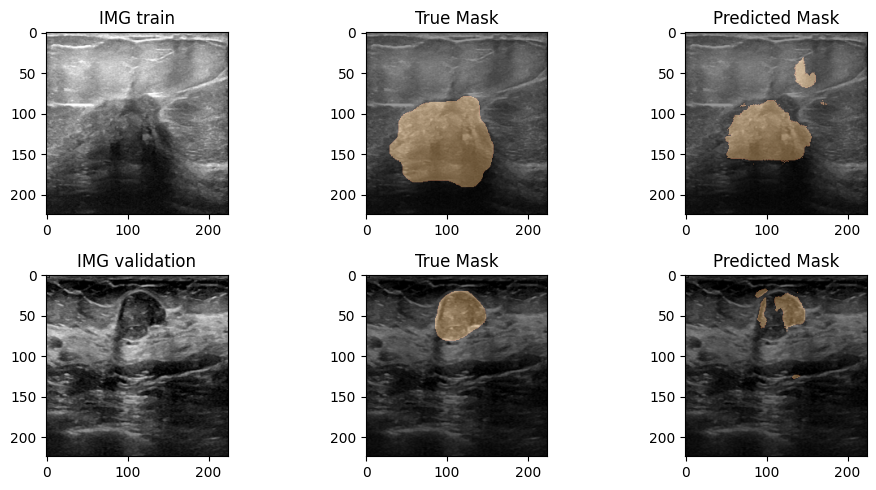

42/42 [==============================] - 4s 106ms/step - loss: 0.0791 - val_loss: 0.1466
Epoch 37/50
41/42 [============================>.] - ETA: 0s - loss: 0.0722End epoch 36 of training


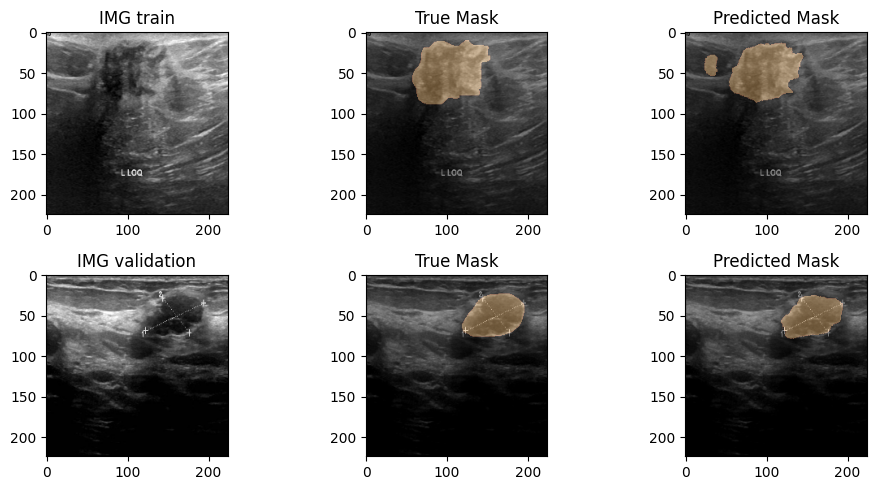

42/42 [==============================] - 4s 100ms/step - loss: 0.0725 - val_loss: 0.1326
Epoch 38/50
41/42 [============================>.] - ETA: 0s - loss: 0.0634End epoch 37 of training


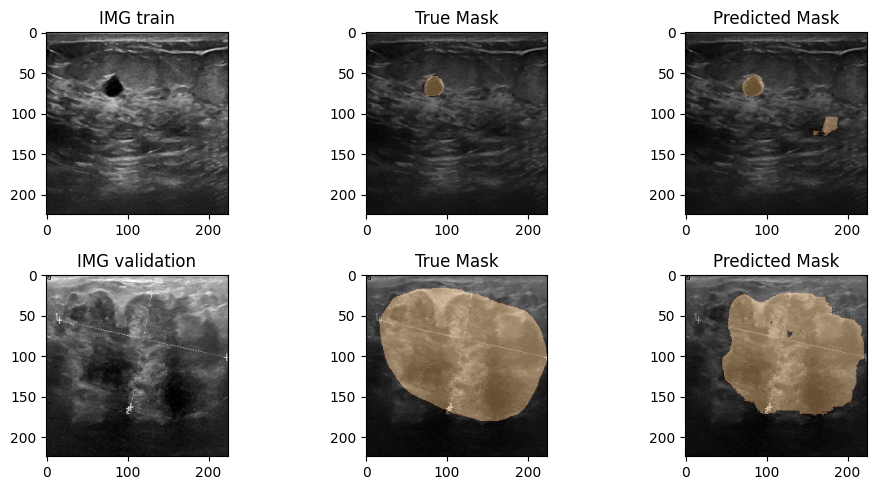

42/42 [==============================] - 4s 100ms/step - loss: 0.0638 - val_loss: 0.1348
Epoch 39/50
41/42 [============================>.] - ETA: 0s - loss: 0.0663End epoch 38 of training


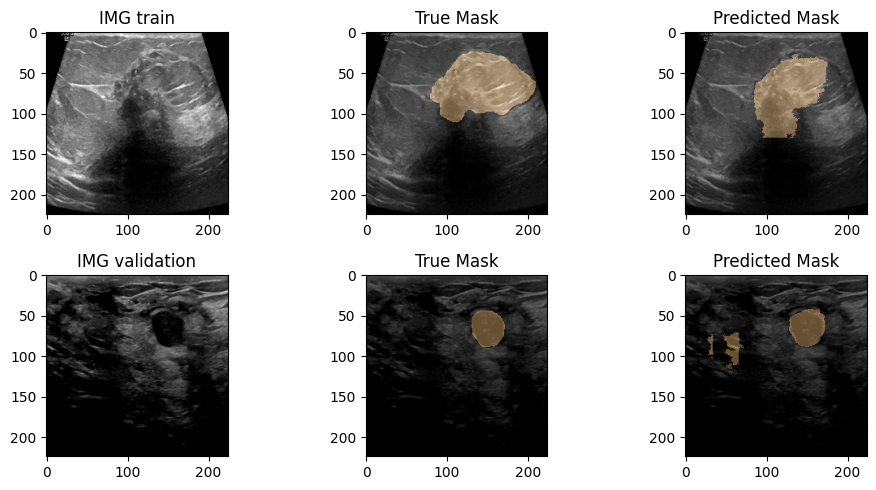

42/42 [==============================] - 4s 100ms/step - loss: 0.0665 - val_loss: 0.1276
Epoch 40/50
41/42 [============================>.] - ETA: 0s - loss: 0.0592End epoch 39 of training


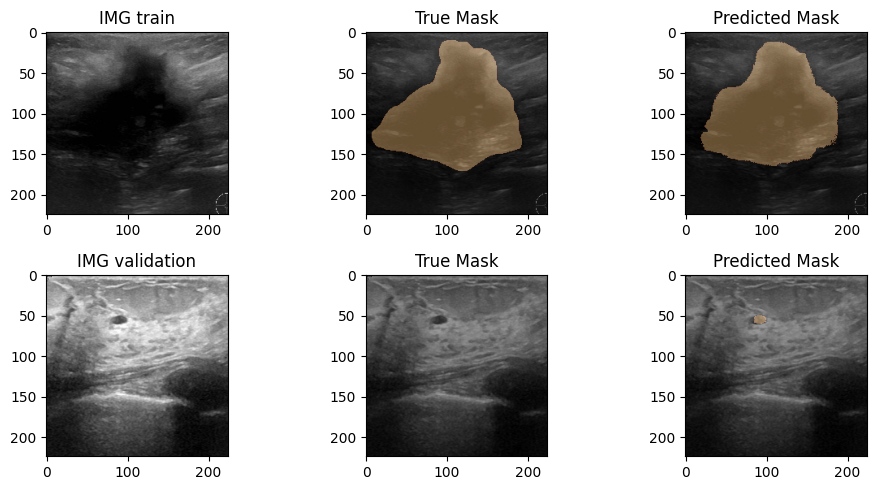

42/42 [==============================] - 4s 100ms/step - loss: 0.0594 - val_loss: 0.1287
Epoch 41/50
41/42 [============================>.] - ETA: 0s - loss: 0.0505End epoch 40 of training


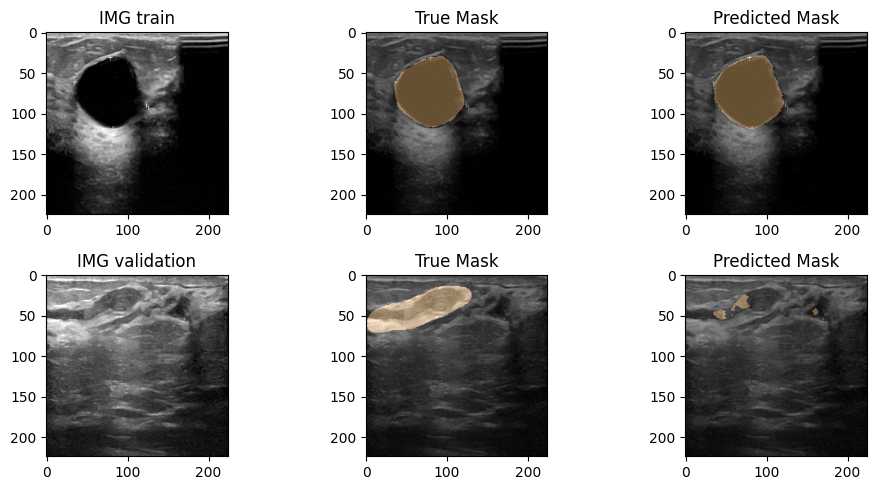

42/42 [==============================] - 4s 100ms/step - loss: 0.0504 - val_loss: 0.1408
Epoch 42/50
41/42 [============================>.] - ETA: 0s - loss: 0.0434End epoch 41 of training


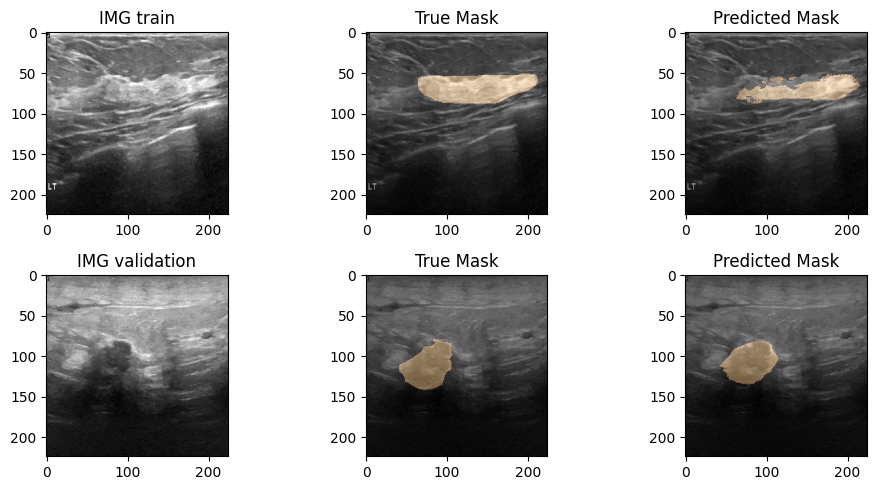

42/42 [==============================] - 4s 101ms/step - loss: 0.0446 - val_loss: 0.1575
Epoch 43/50
41/42 [============================>.] - ETA: 0s - loss: 0.0441End epoch 42 of training


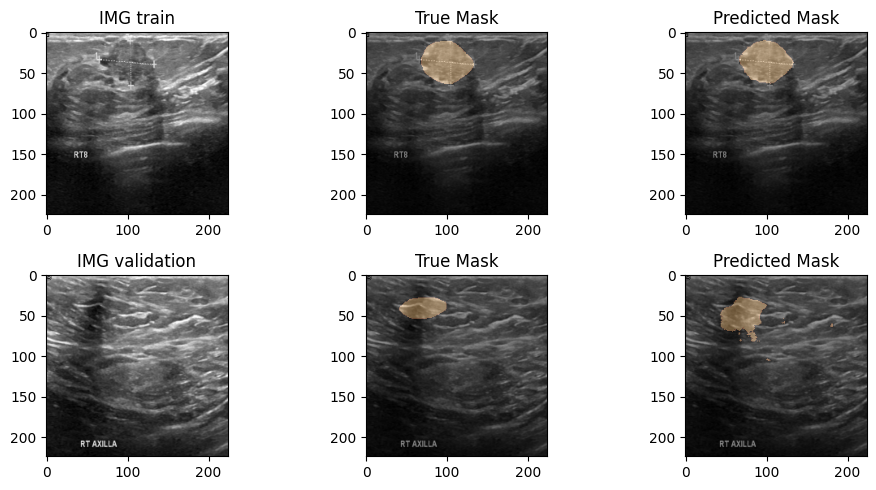

42/42 [==============================] - 4s 107ms/step - loss: 0.0439 - val_loss: 0.1692
Epoch 44/50
41/42 [============================>.] - ETA: 0s - loss: 0.0381End epoch 43 of training


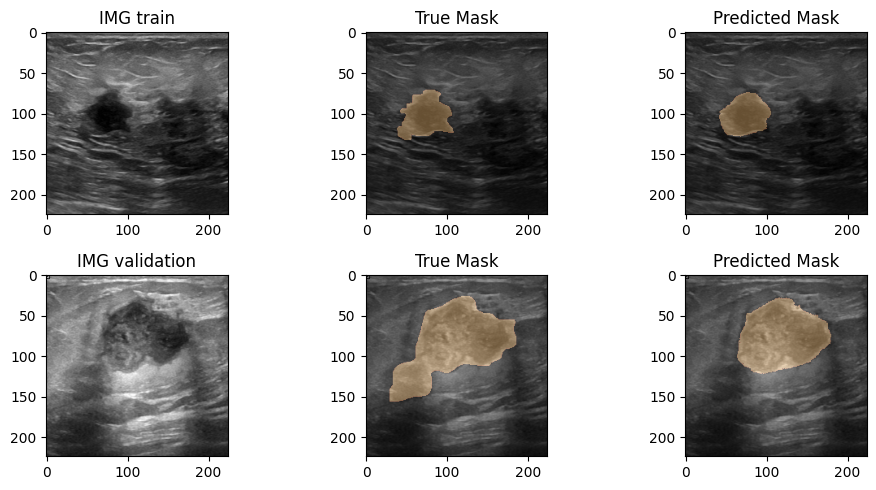

42/42 [==============================] - 4s 100ms/step - loss: 0.0379 - val_loss: 0.1787
Epoch 45/50
41/42 [============================>.] - ETA: 0s - loss: 0.0337End epoch 44 of training


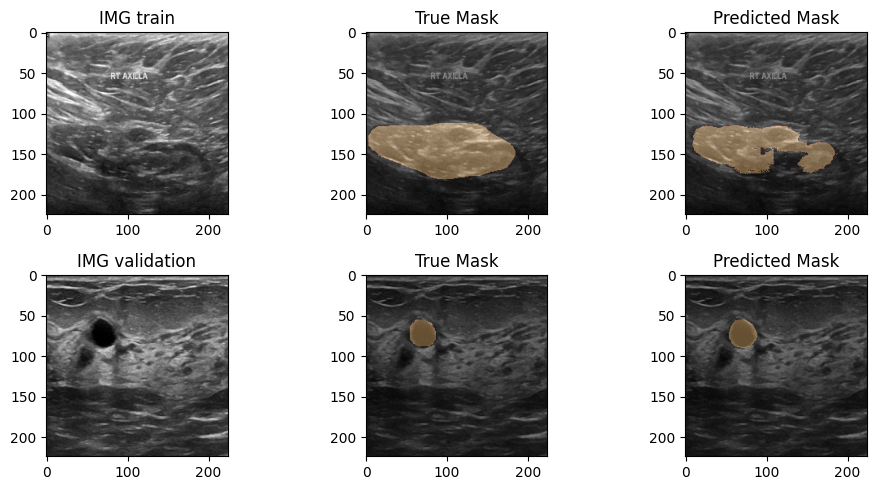

42/42 [==============================] - 4s 100ms/step - loss: 0.0340 - val_loss: 0.1612
Epoch 46/50
41/42 [============================>.] - ETA: 0s - loss: 0.0336End epoch 45 of training


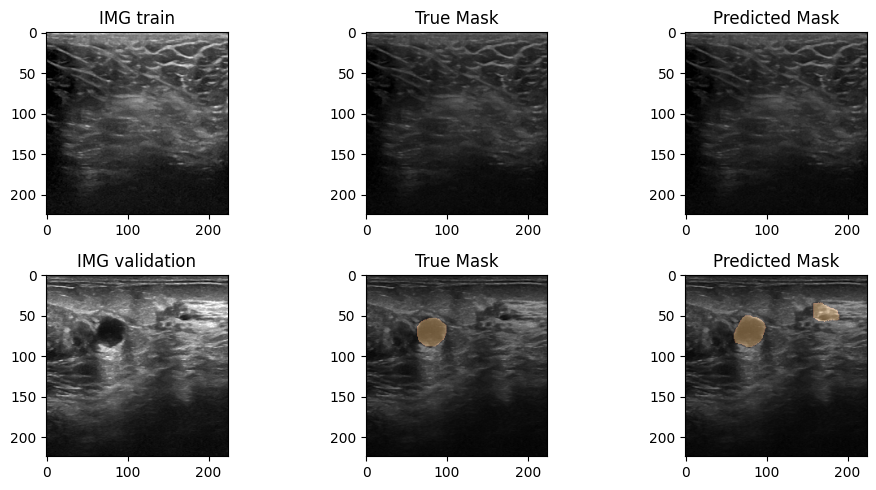

42/42 [==============================] - 4s 100ms/step - loss: 0.0334 - val_loss: 0.1763
Epoch 47/50
41/42 [============================>.] - ETA: 0s - loss: 0.0294End epoch 46 of training


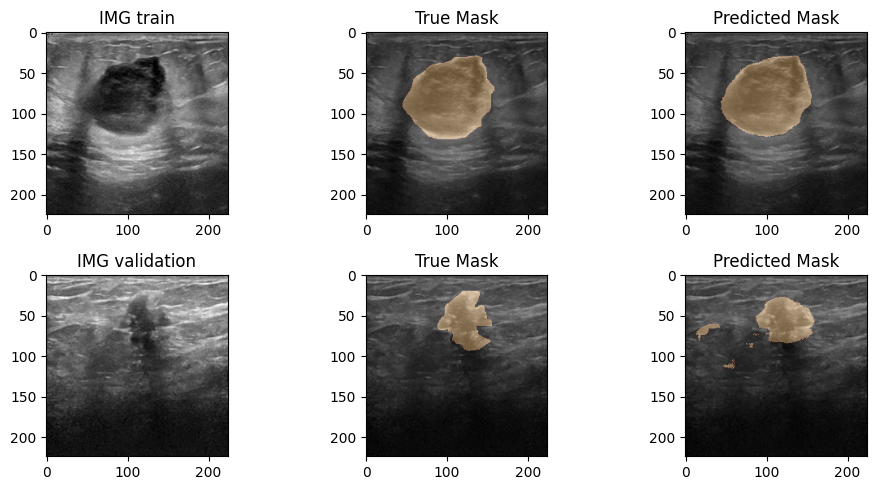

42/42 [==============================] - 4s 101ms/step - loss: 0.0294 - val_loss: 0.1857
Epoch 48/50
41/42 [============================>.] - ETA: 0s - loss: 0.0433End epoch 47 of training


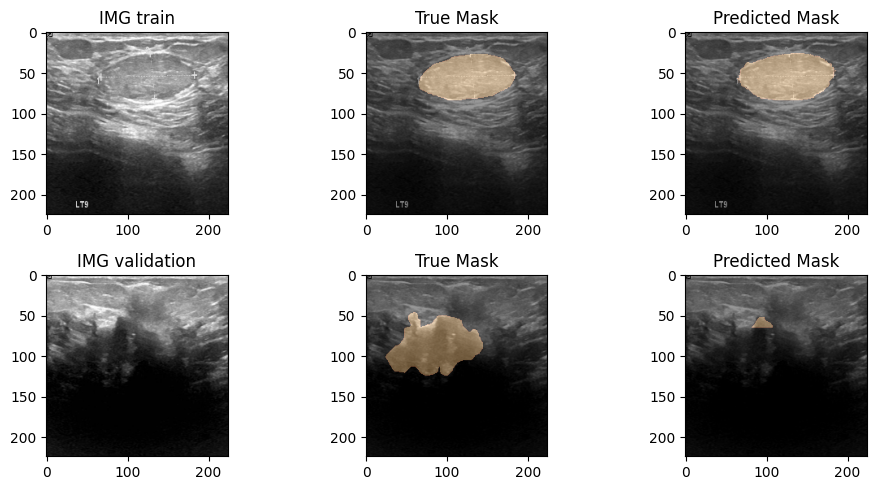

42/42 [==============================] - 4s 101ms/step - loss: 0.0433 - val_loss: 0.1715
Epoch 49/50
41/42 [============================>.] - ETA: 0s - loss: 0.0364End epoch 48 of training


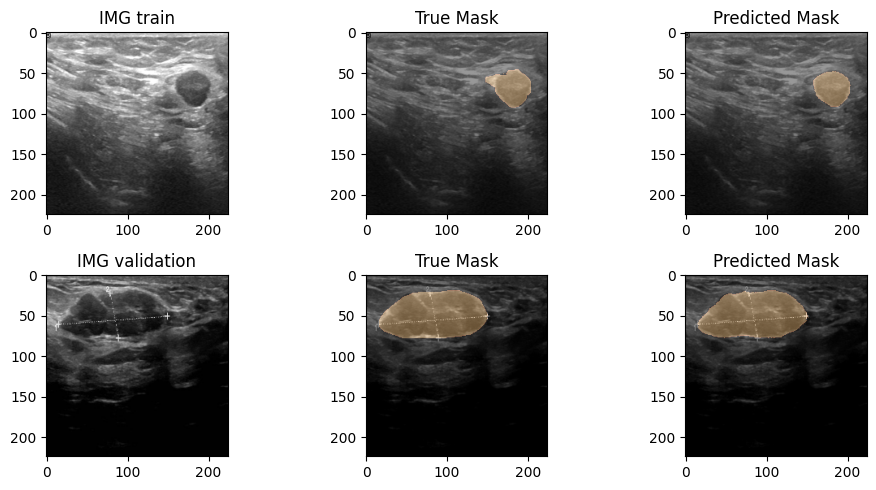

42/42 [==============================] - 4s 100ms/step - loss: 0.0365 - val_loss: 0.1812
Epoch 50/50
41/42 [============================>.] - ETA: 0s - loss: 0.0295End epoch 49 of training


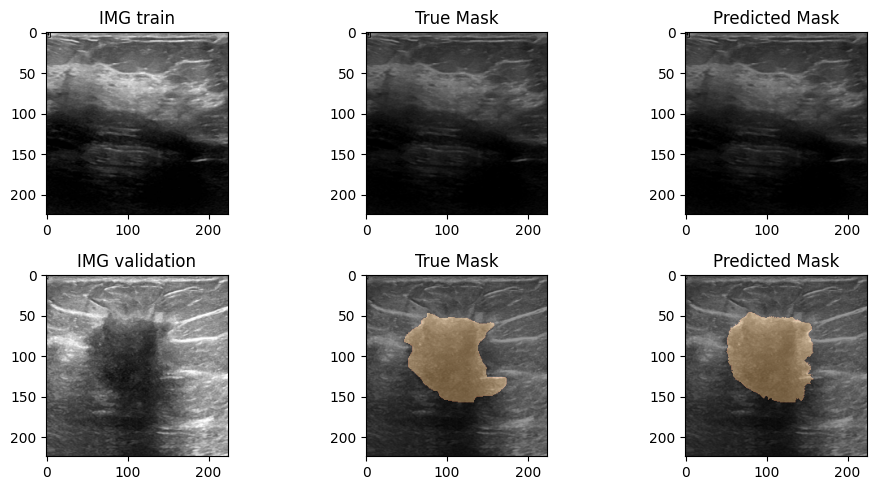

42/42 [==============================] - 4s 101ms/step - loss: 0.0296 - val_loss: 0.1727


In [13]:
device_name = tf.test.gpu_device_name()

BATCH_SIZE =  16
EPOCHS = 50
LearningRate = 0.001


loss_fn = tf.keras.losses.BinaryCrossentropy(from_logits=True)
optim = tf.keras.optimizers.Adam(learning_rate=LearningRate)
model = Unet_2(img_size=IMG_IN, in_channels=IN_CHANNEL, out_channels= 1)
model.compile(optimizer=optim, loss=loss_fn)

with tf.device(device_name):
    model.fit(X_train, Y_train, batch_size=BATCH_SIZE, epochs=EPOCHS, validation_data=(X_test, Y_test), callbacks=[drawResult()], verbose=1)